# Detectron2 Custom Training Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2!

# Install detectron2

In [1]:
!pwd


/content


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd ./drive/MyDrive/Virtual Laboratory/Virtual_Lab_02/iNeuron_DataScience/16_DL_Computer_Vision/11_Object_Detection_CUSTOM_Detectron2


/content/drive/.shortcut-targets-by-id/1ybC2s2pso1TFHXle2VA2FLdjWbIDUtAc/Virtual_Lab_02/iNeuron_DataScience/16_DL_Computer_Vision/11_Object_Detection_CUSTOM_Detectron2


In [4]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core

# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions


#!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))


# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44091 sha256=9ba7e82e60bf509086898e7b043064a67be0f873a6e0320ff04bc5157f7c8541
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
flax 0.7.0 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.3 MB/s eta 0:00:00
  Preparin

In [5]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
#!unzip data.zip

## Register Dataset and Annotations

In [6]:
from detectron2.data.datasets import register_coco_instances



register_coco_instances("Custom_BreastCancer_Detector_TRAIN", {}, "./dataset/annotations/train_annotations.coco.json", "./dataset/train")
register_coco_instances("Custom_BreastCancer_Detector_VALID", {}, "./dataset/annotations/valid_annotations.coco.json", "./dataset/valid")
register_coco_instances("Custom_BreastCancer_Detector_TEST", {}, "./dataset/annotations/test_annotations.coco.json", "./dataset/test")

In [7]:
sample_metadata_TRAIN = MetadataCatalog.get("Custom_BreastCancer_Detector_TRAIN")
dataset_dicts_TRAIN = DatasetCatalog.get("Custom_BreastCancer_Detector_TRAIN")

WARNING [08/05 11:08:40 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/05 11:08:40 d2.data.datasets.coco]: Loaded 542 images in COCO format from ./dataset/annotations/train_annotations.coco.json


## Visualize Some Instances From Dataset

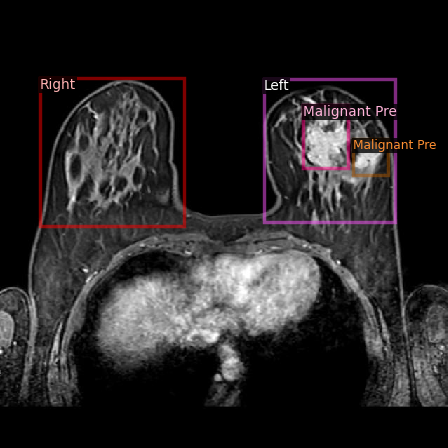

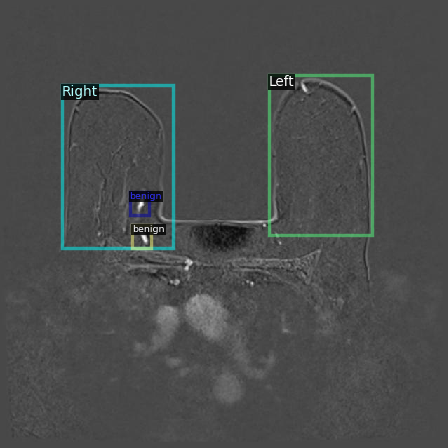

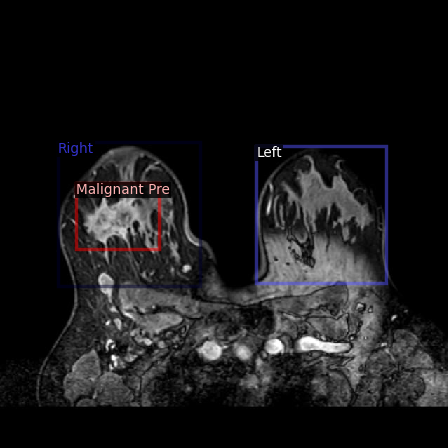

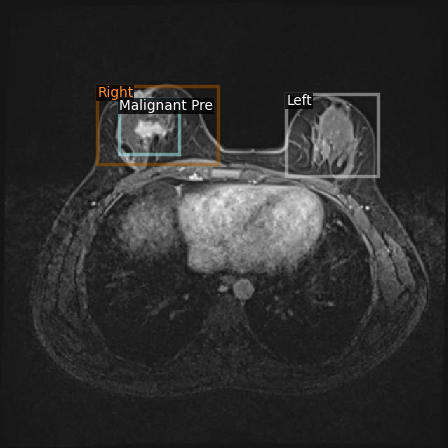

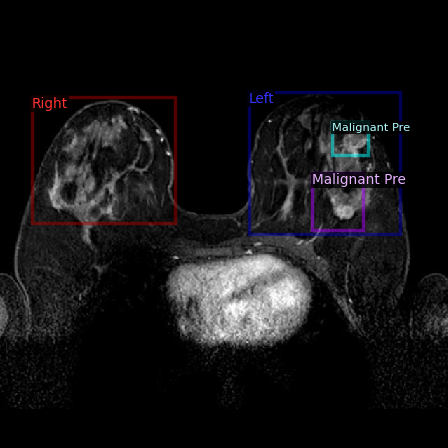

In [8]:
import random

for d in random.sample(dataset_dicts_TRAIN, 5):

    img = cv2.imread(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1],
                            metadata=sample_metadata_TRAIN,
                            scale=0.7)

    vis = visualizer.draw_dataset_dict(d)

    cv2_imshow(vis.get_image()[:, :, ::-1])

In [26]:
from detectron2.engine import DefaultTrainer


cfg = get_cfg()

######################################################################

cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("Custom_BreastCancer_Detector_TRAIN",)
cfg.DATASETS.TEST = ()

cfg.DATALOADER.NUM_WORKERS = 2

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo



#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 500   #Number of detetions or proposals per image
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5

# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.25

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR

#cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.MAX_ITER = 2000



##################################################################

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[08/05 11:27:15 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:08, 20.7MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/05 11:27:23 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/05 11:27:43 d2.utils.events]:  eta: 0:16:43  iter: 19  total_loss: 1.95  loss_cls: 1.454  loss_box_reg: 0.242  loss_rpn_cls: 0.2062  loss_rpn_loc: 0.02931    time: 0.5230  last_time: 0.4185  data_time: 0.2131  last_data_time: 0.0624   lr: 4.9952e-05  max_mem: 1735M
[08/05 11:27:58 d2.utils.events]:  eta: 0:15:08  iter: 39  total_loss: 1.046  loss_cls: 0.6059  loss_box_reg: 0.3365  loss_rpn_cls: 0.09642  loss_rpn_loc: 0.02093    time: 0.5600  last_time: 0.4679  data_time: 0.1315  last_data_time: 0.1486   lr: 9.9902e-05  max_mem: 1735M
[08/05 11:28:08 d2.utils.events]:  eta: 0:15:09  iter: 59  total_loss: 0.7572  loss_cls: 0.3601  loss_box_reg: 0.3203  loss_rpn_cls: 0.05367  loss_rpn_loc: 0.02625    time: 0.5335  last_time: 0.4836  data_time: 0.1581  last_data_time: 0.1564   lr: 0.00014985  max_mem: 1735M
[08/05 11:28:18 d2.utils.events]:  eta: 0:14:41  iter: 79  total_loss: 0.6631  loss_cls: 0.3009  loss_box_reg: 0.3001  loss_rpn_cls: 0.02225  loss_rpn_loc: 0.01709    time: 0.5210  

## Resume Training

In [54]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()

cfg.merge_from_file("custom_config.yml")  # Load your custom config file

# Update paths and configurations as needed
cfg.DATASETS.TRAIN = ("Custom_BreastCancer_Detector_TRAIN",)
cfg.DATASETS.TEST = ()

# Set the path to your checkpoint
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Load your checkpoint file

cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.15
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1000   #Number of detetions or proposals per image
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 3000

cfg.SOLVER.BASE_LR = 0.0005  # pick a good LR
cfg.SOLVER.MAX_ITER = 7000  # number of iterations to train (this will resume from the previous checkpoint)


###########################################################
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[08/05 12:38:03 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

## Monitor Model Training Using tensoboard

In [27]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

## Load Prdictor Model (That we just trained)

In [55]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set the testing threshold for this model

#cfg.DATASETS.TEST = ("Custom_BreastCancer_Detector", )

predictor = DefaultPredictor(cfg)

[08/05 12:44:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


## Visualize Random samples From Validation set

WARNING [08/05 12:44:19 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/05 12:44:19 d2.data.datasets.coco]: Loaded 122 images in COCO format from ./dataset/annotations/valid_annotations.coco.json


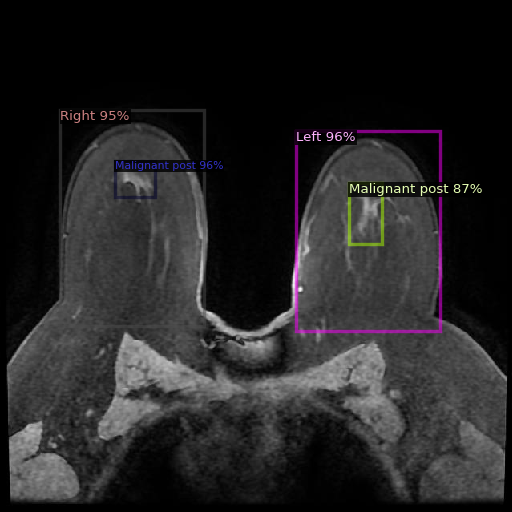

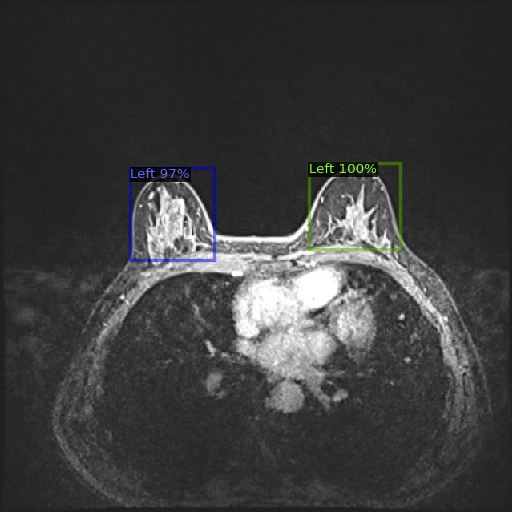

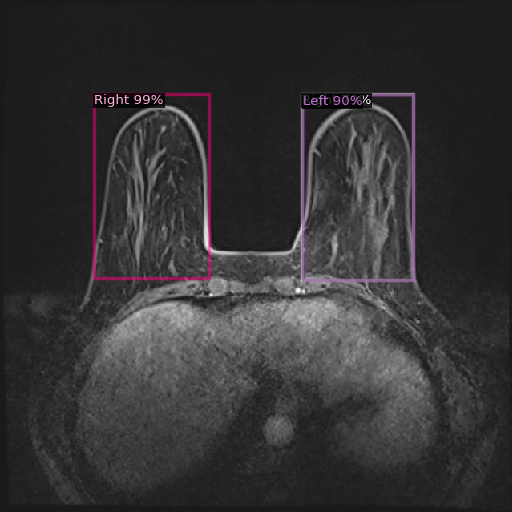

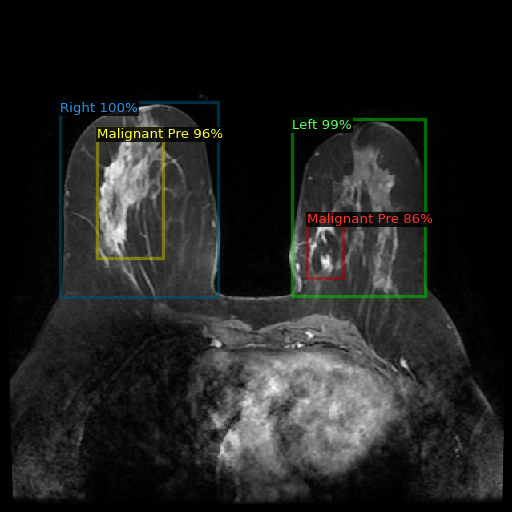

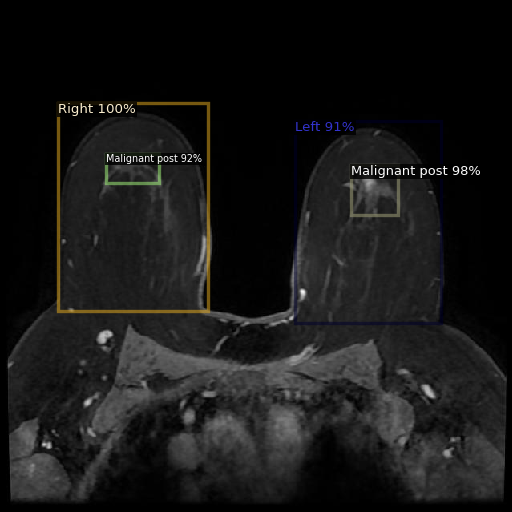

In [56]:
from detectron2.utils.visualizer import ColorMode

sample_metadata_VALID = MetadataCatalog.get("Custom_BreastCancer_Detector_VALID")
dataset_dicts_VALID = DatasetCatalog.get("Custom_BreastCancer_Detector_VALID")


for d in random.sample(dataset_dicts_VALID, 5):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metadata_VALID,
                   scale=0.8,

                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )


    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])



    ###################################################

    ################ In metadata ###################
    # Right breast: Cyan
    # Left breast: Orange
    # Benign: Purple
    # Malignant Pre: Yellow
    # Malignant Post: Blue

### Evaluation
We can evaluate its performance using AP metric implemented in COCO API.


In [57]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("Custom_BreastCancer_Detector_VALID", ("bbox",), False, output_dir="./output/")

val_loader = build_detection_test_loader(cfg, "Custom_BreastCancer_Detector_VALID")



print(inference_on_dataset(predictor.model, val_loader, evaluator))

[08/05 12:44:40 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [08/05 12:44:40 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/05 12:44:40 d2.data.datasets.coco]: Loaded 122 images in COCO format from ./dataset/annotations/valid_annotations.coco.json
[08/05 12:44:40 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/05 12:44:40 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[08/05 12:44:40 d2.data.common]: Serializing 122 elements to byte tensors and concatenating them all ...
[08/05 12:44:40 d2.data.common]: Serialized dataset takes 0.04 MiB
[08/05 12:44:40 d2.evaluation.evaluator]: Start inference on 122 batches
[08/05 12:44:41 d2.evaluation.evaluator]: Inference done 11/122. Dataloading: 0

### Getting the custom config file

In [58]:
f = open('custom_config.yml', 'w')
f.write(cfg.dump())
f.close()